In [2]:
import kagglehub
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy

# **Завантаження попередньо підготовлених датасетів**

In [3]:
path_users = './data/Normalized_dataset_users.csv'
path_features = './data/Normalized_dataset_features.csv'
path_profiles = './data/User_Profiles.csv'
path_user_profiles_KMEANS = './data/User_Profiles_clusterized.csv'
path_user_profiles_Hierarchical = './data/User_Profiles_hierarchical_clusterized.csv'

In [4]:
df_users = pd.read_csv(path_users, on_bad_lines='skip')
df_users.shape

(9711301, 4)

In [5]:
df_features = pd.read_csv(path_features, on_bad_lines='skip')
df_features.shape

(50683, 18)

In [6]:
df_profiles = pd.read_csv(path_profiles, on_bad_lines='skip', index_col='Unnamed: 0')
df_profiles.shape

(1000, 12)

In [7]:
df_profiles.sample()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
bebeaccd02e67c4c5cb50442e0d8788b673a5a2c,0.540709,0.650078,0.538292,0.824147,0.609091,0.054785,0.283268,0.161158,0.190057,0.455436,0.522378,0.778182


# **Візуалізація даних**

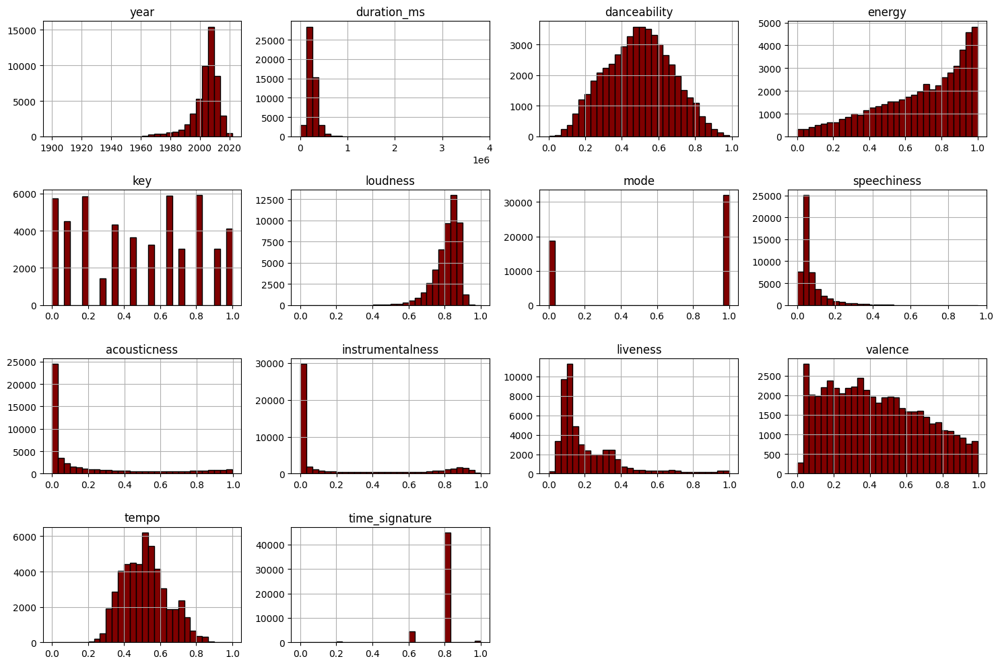

In [8]:
df_features.hist(color='maroon', bins=30, edgecolor='black', figsize=(15, 10))
plt.tight_layout()
plt.show()

(array([ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        11.5, 12.5, 13.5]),
 [Text(0.5, 0, 'year'),
  Text(1.5, 0, 'duration_ms'),
  Text(2.5, 0, 'danceability'),
  Text(3.5, 0, 'energy'),
  Text(4.5, 0, 'key'),
  Text(5.5, 0, 'loudness'),
  Text(6.5, 0, 'mode'),
  Text(7.5, 0, 'speechiness'),
  Text(8.5, 0, 'acousticness'),
  Text(9.5, 0, 'instrumentalness'),
  Text(10.5, 0, 'liveness'),
  Text(11.5, 0, 'valence'),
  Text(12.5, 0, 'tempo'),
  Text(13.5, 0, 'time_signature')])

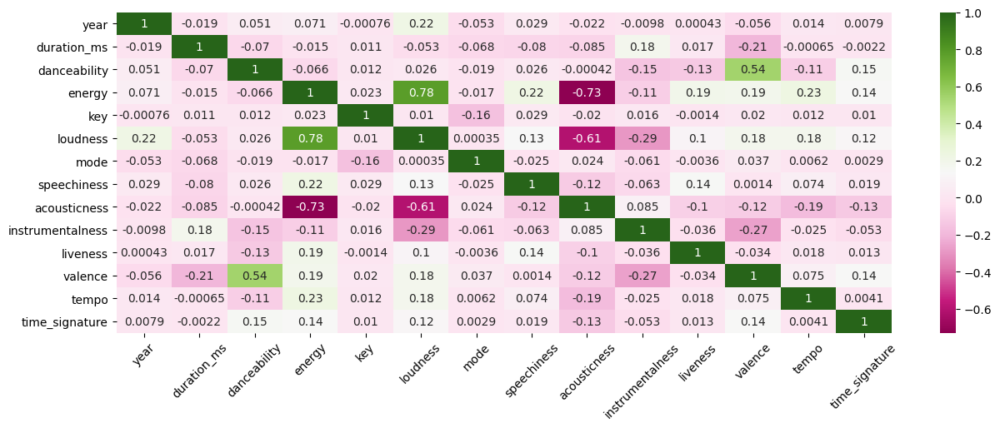

In [9]:
plt.figure(figsize=(15, 5))
sns.heatmap(data=df_features.corr(numeric_only=True), annot=True, cmap='PiYG')
plt.xticks(rotation=45)

# **Ініціалізуймо користувача**

In [10]:
random_user = df_profiles.sample()

## **Косинусна схожість**

In [11]:
features = ['danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'time_signature']

In [12]:
def cossine_similarity(user_profile:pd.DataFrame, songs_df:pd.DataFrame):
  return np.dot(user_profile, songs_df) / (np.linalg.norm(user_profile) * np.linalg.norm(songs_df))

In [13]:
df_features['cossine_similarity'] = df_features[features].apply(
    lambda row: cossine_similarity(
        user_profile=random_user,
        songs_df=row.values
    )[0], axis=1
)

C:\Users\Влада\AppData\Local\Temp\ipykernel_19168\4107276661.py:2: RuntimeWarning: invalid value encountered in divide
  return np.dot(user_profile, songs_df) / (np.linalg.norm(user_profile) * np.linalg.norm(songs_df))


In [14]:
limit = 20
recommendations = df_features.sort_values(by='cossine_similarity', ascending=False).head(limit)

# **Візуалізація результатів (косинусна схожість)**

In [15]:
def plot_user_recommendation(recommendations:pd.DataFrame, features:list, user_profile:pd.DataFrame, metric:str):
  num_features = len(features)

  angles = np.linspace(0, 2 * np.pi, num_features, endpoint=False)
  angles = np.append(angles, angles[0])

  values_rs = user_profile[features].values.flatten()
  values_rs = np.append(values_rs, values_rs[0])

  rows = recommendations.shape[0] // 5
  fig, axs = plt.subplots(rows, 5, figsize=(25, 10 * (rows // 2)), subplot_kw={'projection': 'polar'}, layout='constrained')
  fig.suptitle(f'Visualization of User Recommendations ({metric})', fontsize=16, fontweight='bold')

  for i, (index, rec) in enumerate(recommendations.iterrows()):
      row = i // 5
      col = i % 5

      values = rec[features].values
      values = np.append(values, values[0])

      ax = axs[row, col]
      ax.fill(angles, values, color='maroon', alpha=0.25)
      ax.plot(angles, values, color='maroon', linewidth=2)
      ax.fill(angles, values_rs, color='yellow', alpha=0.1)
      ax.plot(angles, values_rs, color='yellow', linewidth=2)
      ax.set_xticks(angles[:-1])
      ax.set_xticklabels(features, fontsize=8)
      ax.set_yticklabels([])
      ax.set_title(f'{rec["name"]}\nby {rec["artist"]}',size='medium', fontweight='bold')

  plt.show()

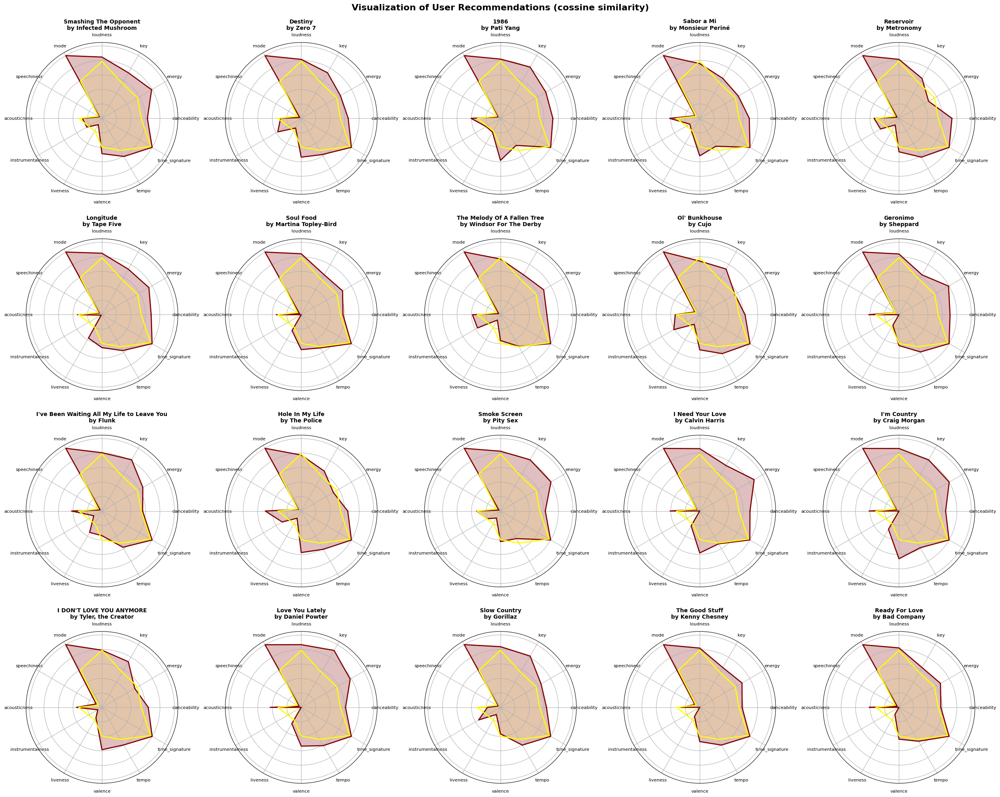

In [16]:
plot_user_recommendation(
    recommendations=recommendations,
    features=features,
    user_profile=random_user,
    metric='cossine similarity'
)

# **Евклідова відстань**

In [17]:
def euclidean_distance(user_profile, songs_df):
    user_profile = np.asarray(user_profile)
    songs_df = np.asarray(songs_df)
    return np.sqrt(np.sum((user_profile - songs_df) ** 2))

In [18]:
df_features['euclidean_distance'] = df_features[features].apply(
    lambda row: euclidean_distance(
        user_profile=random_user,
        songs_df=row.values
    ), axis=1
)

In [19]:
recs_by_ev = df_features.sort_values(by='euclidean_distance').head(limit)

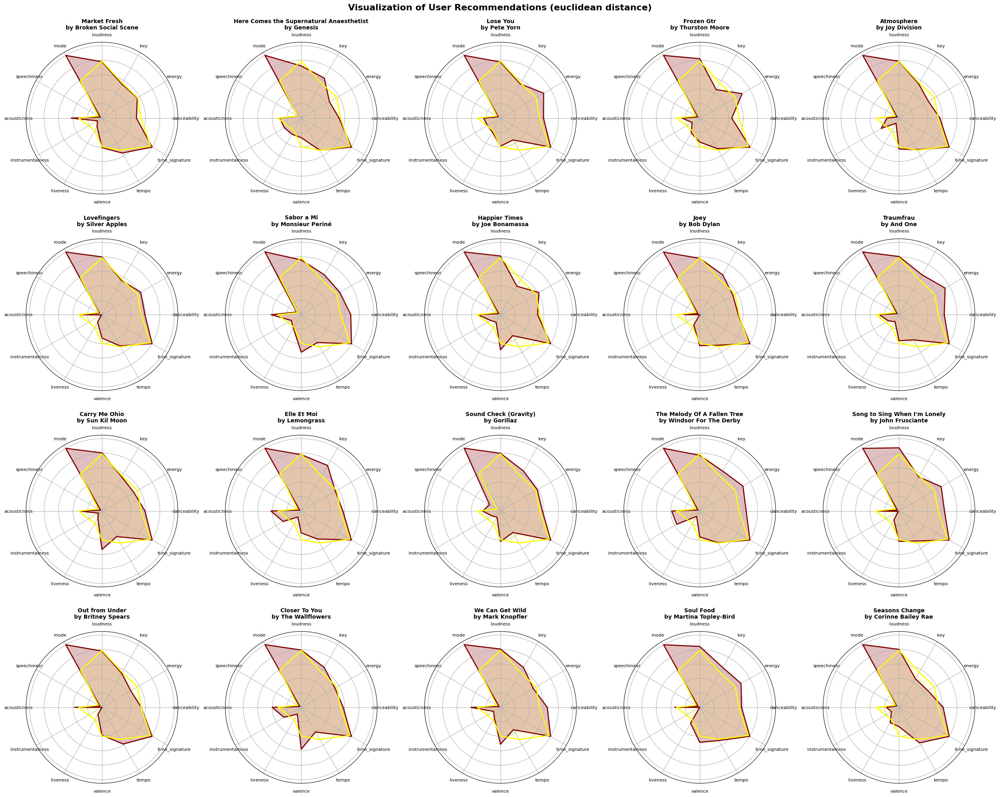

In [20]:
plot_user_recommendation(
    recommendations=recs_by_ev,
    features=features,
    user_profile=random_user,
    metric='euclidean distance'
)

# **Колеляція Пірсона**

In [22]:
def pearson_correlation(user_profile: pd.DataFrame, tracks_df: pd.DataFrame):
    user_profile_series = user_profile.iloc[0].astype(float)

    correlations = tracks_df.apply(lambda track: user_profile_series.corr(track.astype(float)), axis=1)
    return correlations

In [23]:
df_features['pearson_correlation'] = pearson_correlation(random_user, df_features[features])

F:\programs\anaconda3\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
F:\programs\anaconda3\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


In [24]:
recs_by_pc = df_features.sort_values(by='pearson_correlation').tail(limit)

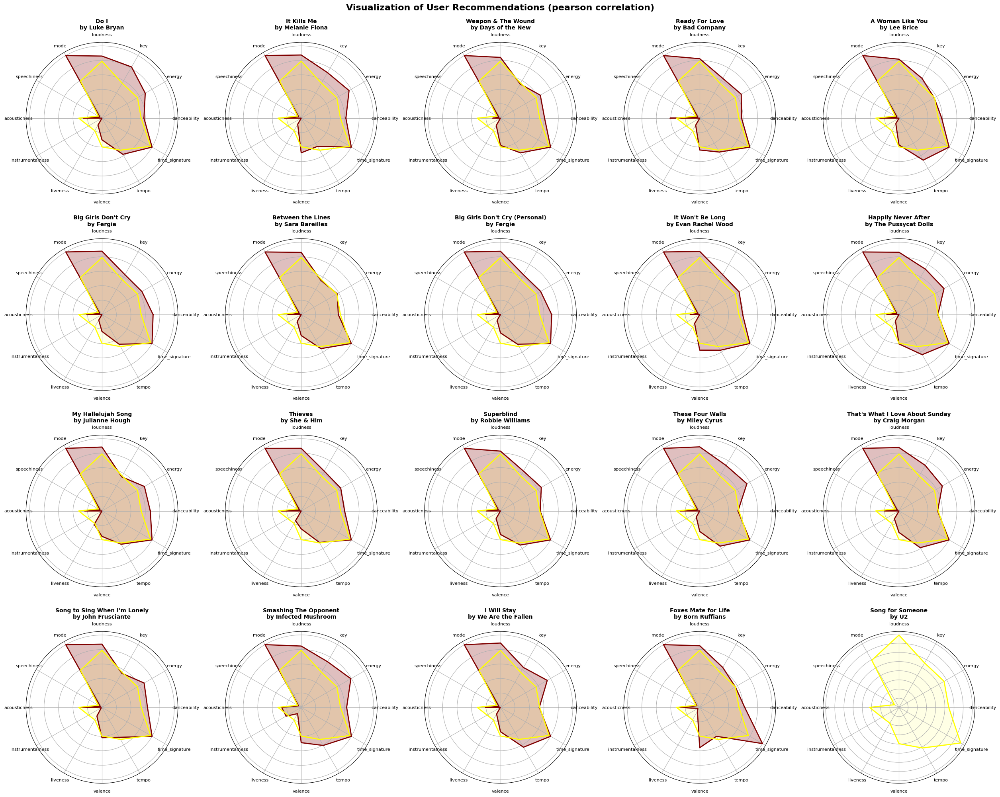

In [25]:
plot_user_recommendation(
    recommendations=recs_by_pc,
    features=features,
    user_profile=random_user,
    metric='pearson correlation'
)

# **Мангеттенська відстань**

In [26]:
def manhattan_distance(user_profile, track_row):
    user_profile = np.asarray(user_profile)
    track_row = np.asarray(track_row)
    return np.sum(np.abs(user_profile - track_row))

In [27]:
df_features['manhattan_distance'] = df_features[features].apply(
    lambda row: manhattan_distance(
        user_profile=random_user,
        track_row=row.values
    ), axis=1
)

In [28]:
recs_by_mand = df_features.sort_values(by='manhattan_distance').head(limit)

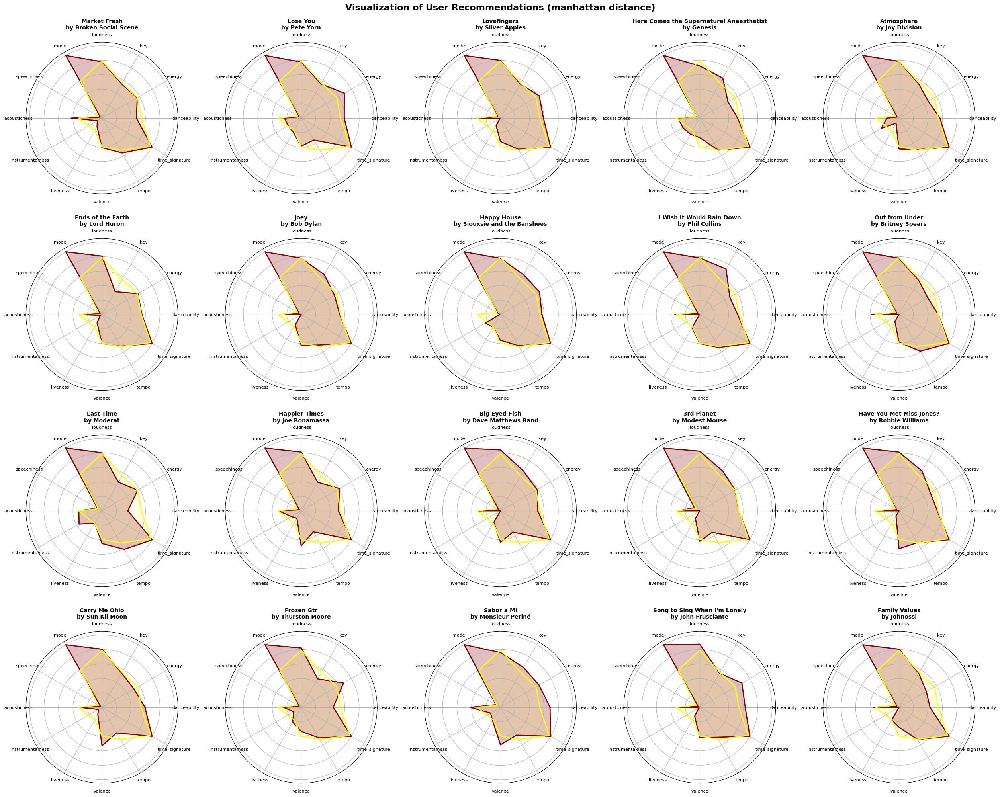

In [29]:
plot_user_recommendation(
    recommendations=recs_by_mand,
    features=features,
    user_profile=random_user,
    metric='manhattan distance'
)

# **Відстань Мінковського при разних значеннях p**

In [30]:
def minkowski_distance(user_profile, track_row, p):
    user_profile = np.asarray(user_profile)
    track_row = np.asarray(track_row)
    return np.sum(np.abs(user_profile - track_row) ** p) ** (1 / p)

In [31]:
df_features['minkowski_distance_p_3'] = df_features[features].apply(
    lambda row: minkowski_distance(
        user_profile=random_user,
        track_row=row.values,
        p=3
    ), axis=1
)

In [32]:
recs_by_md_three = df_features.sort_values(by='minkowski_distance_p_3').head(limit)

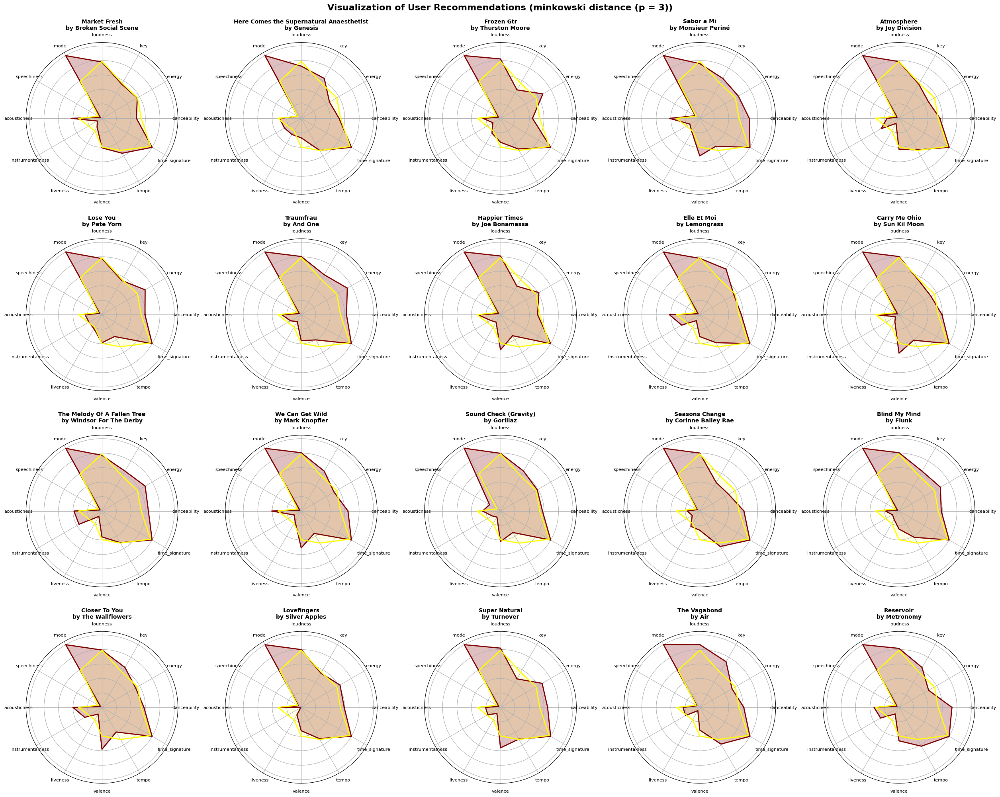

In [33]:
plot_user_recommendation(
    recommendations=recs_by_md_three,
    features=features,
    user_profile=random_user,
    metric='minkowski distance (p = 3)'
)

In [34]:
df_features['minkowski_distance_p_5'] = df_features[features].apply(
    lambda row: minkowski_distance(
        user_profile=random_user,
        track_row=row.values,
        p=5
    ), axis=1
)

In [35]:
recs_by_md_five = df_features.sort_values(by='minkowski_distance_p_5').head(limit)

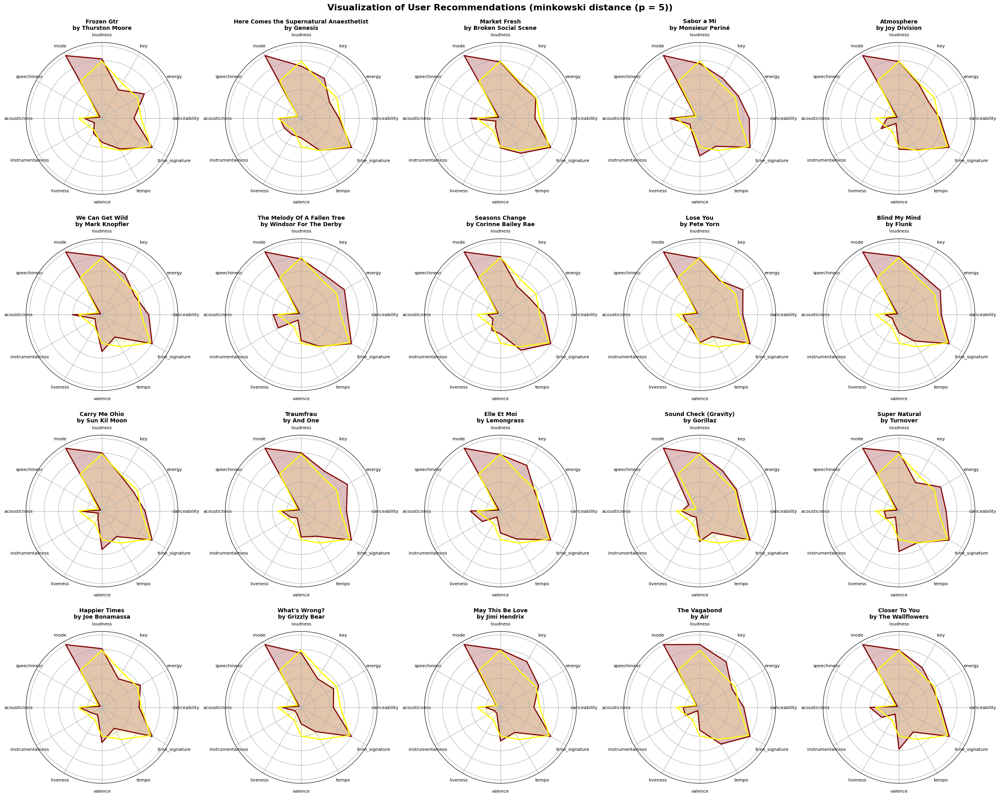

In [36]:
plot_user_recommendation(
    recommendations=recs_by_md_five,
    features=features,
    user_profile=random_user,
    metric='minkowski distance (p = 5)'
)

In [37]:
df_features['minkowski_distance_p_10'] = df_features[features].apply(
    lambda row: minkowski_distance(
        user_profile=random_user,
        track_row=row.values,
        p=10
    ), axis=1
)

In [38]:
recs_by_md_ten = df_features.sort_values(by='minkowski_distance_p_10').head(limit)

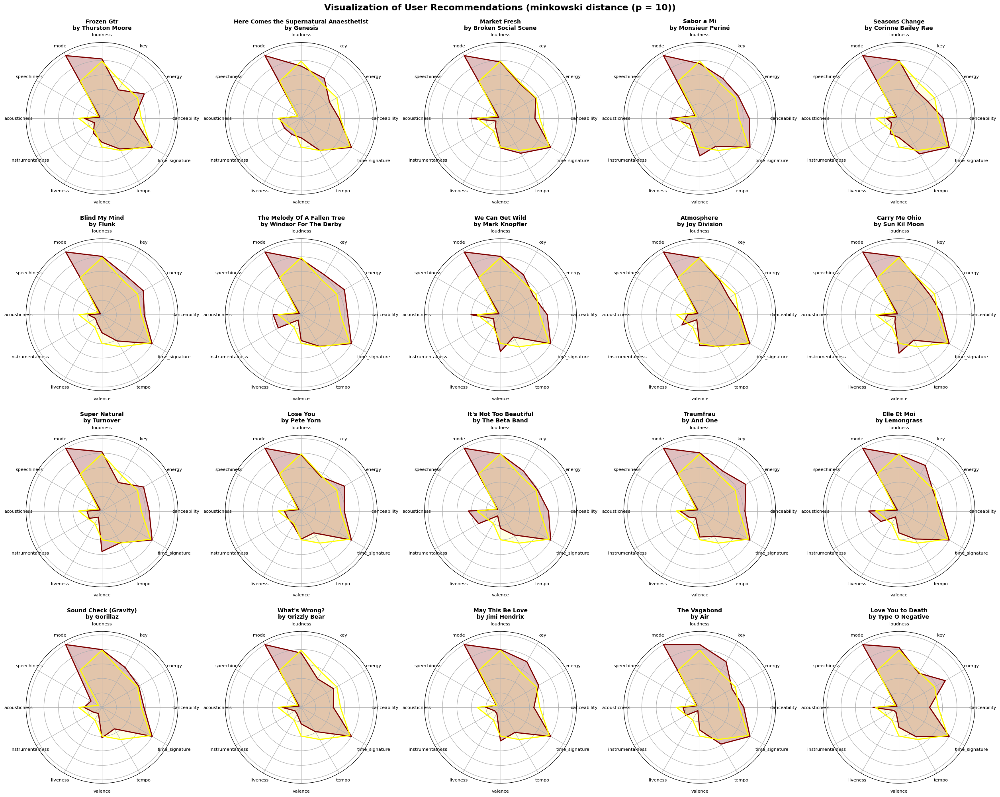

In [39]:
plot_user_recommendation(
    recommendations=recs_by_md_ten,
    features=features,
    user_profile=random_user,
    metric='minkowski distance (p = 10)'
)

# **Аналіз спільних та відмінних рекомендацій**

In [40]:
def commont_tracks(df1, df2):
  indx = df1.index.intersection(df2.index)
  return df_features.iloc[indx]

## **Спільні рекомендації косинусної схожості з кореляціє Пірсона**

In [41]:
commont_tracks(recommendations, recs_by_pc)

,track_id,name,artist,spotify_id,year,duration_ms,danceability,energy,key,loudness,...,valence,tempo,time_signature,cossine_similarity,euclidean_distance,pearson_correlation,manhattan_distance,minkowski_distance_p_3,minkowski_distance_p_5,minkowski_distance_p_10
28806,TRRSXUG12903D00B48,Smashing The Opponent,Infected Mushroom,0074YWTe1Y2BX7HmPcDsks,2009,250053,0.627,0.791,0.727273,0.846281,...,0.487,0.607007,0.8,0.982674,0.534189,0.925869,1.342747,0.442640,0.411840,0.406834
15296,TRLKKYU128F4230035,Ready For Love,Bad Company,04Ya4L3g4feB43dG6hlDZi,1970,300026,0.579,0.663,0.636364,0.822381,...,0.440,0.540932,0.8,0.976031,0.498597,0.917489,1.165565,0.430976,0.410123,0.406794


## **Спільні рекомендації косинусної схожості з Мангеттенською відстанню**

In [42]:
commont_tracks(recommendations, recs_by_mand)

,track_id,name,artist,spotify_id,year,duration_ms,danceability,energy,key,loudness,...,valence,tempo,time_signature,cossine_similarity,euclidean_distance,pearson_correlation,manhattan_distance,minkowski_distance_p_3,minkowski_distance_p_5,minkowski_distance_p_10
49350,TRWJZEG12903D0820E,Sabor a Mi,Monsieur Periné,2zBI3LaV4emotGL1cS5Jst,2014,197480,0.683,0.615,0.636364,0.75546,...,0.517,0.443873,0.8,0.979258,0.476181,0.894699,1.098372,0.419416,0.407408,0.406729


## **Спільні рекомендації косинусної схожості з евклідовою відстанню**

In [43]:
commont_tracks(recommendations, recs_by_ev)

,track_id,name,artist,spotify_id,year,duration_ms,danceability,energy,key,loudness,...,valence,tempo,time_signature,cossine_similarity,euclidean_distance,pearson_correlation,manhattan_distance,minkowski_distance_p_3,minkowski_distance_p_5,minkowski_distance_p_10
49350,TRWJZEG12903D0820E,Sabor a Mi,Monsieur Periné,2zBI3LaV4emotGL1cS5Jst,2014,197480,0.683,0.615,0.636364,0.755460,...,0.517,0.443873,0.8,0.979258,0.476181,0.894699,1.098372,0.419416,0.407408,0.406729
21129,TRSAYQJ128F427CA25,Soul Food,Martina Topley-Bird,5IFDzcphcoOm87wx1WK8ll,2004,329720,0.578,0.660,0.636364,0.843028,...,0.483,0.530132,0.8,0.978079,0.492889,0.914425,1.117140,0.429897,0.410082,0.406795
23177,TRURIBU128F148C813,The Melody Of A Fallen Tree,Windsor For The Derby,0a1hTNhJ61TuW60bDWSiFU,2006,496013,0.641,0.689,0.636364,0.769523,...,0.357,0.504414,0.8,0.977981,0.489385,0.895900,1.152848,0.423297,0.407739,0.406730


## **Спільні рекомендації косинусної схожості з відстанню Мінковського (p = 3)**

In [44]:
commont_tracks(recommendations, recs_by_md_three)

,track_id,name,artist,spotify_id,year,duration_ms,danceability,energy,key,loudness,...,valence,tempo,time_signature,cossine_similarity,euclidean_distance,pearson_correlation,manhattan_distance,minkowski_distance_p_3,minkowski_distance_p_5,minkowski_distance_p_10
49350,TRWJZEG12903D0820E,Sabor a Mi,Monsieur Periné,2zBI3LaV4emotGL1cS5Jst,2014,197480,0.683,0.615,0.636364,0.755460,...,0.517,0.443873,0.8,0.979258,0.476181,0.894699,1.098372,0.419416,0.407408,0.406729
37102,TRLMIKF128F934A29A,Reservoir,Metronomy,0070U7WyuJjyt2bbahCToq,2014,193146,0.731,0.472,0.636364,0.814698,...,0.462,0.619239,0.8,0.978400,0.499850,0.900065,1.214882,0.427806,0.408734,0.406747
23177,TRURIBU128F148C813,The Melody Of A Fallen Tree,Windsor For The Derby,0a1hTNhJ61TuW60bDWSiFU,2006,496013,0.641,0.689,0.636364,0.769523,...,0.357,0.504414,0.8,0.977981,0.489385,0.895900,1.152848,0.423297,0.407739,0.406730


## **Спільні рекомендації косинусної схожості з відстанню Мінковського (p = 5)**

In [45]:
commont_tracks(recommendations, recs_by_md_five)

,track_id,name,artist,spotify_id,year,duration_ms,danceability,energy,key,loudness,...,valence,tempo,time_signature,cossine_similarity,euclidean_distance,pearson_correlation,manhattan_distance,minkowski_distance_p_3,minkowski_distance_p_5,minkowski_distance_p_10
49350,TRWJZEG12903D0820E,Sabor a Mi,Monsieur Periné,2zBI3LaV4emotGL1cS5Jst,2014,197480,0.683,0.615,0.636364,0.755460,...,0.517,0.443873,0.8,0.979258,0.476181,0.894699,1.098372,0.419416,0.407408,0.406729
23177,TRURIBU128F148C813,The Melody Of A Fallen Tree,Windsor For The Derby,0a1hTNhJ61TuW60bDWSiFU,2006,496013,0.641,0.689,0.636364,0.769523,...,0.357,0.504414,0.8,0.977981,0.489385,0.895900,1.152848,0.423297,0.407739,0.406730


## **Спільні рекомендації косинусної схожості з відстанню Мінковського (p = 10)**

In [46]:
commont_tracks(recommendations, recs_by_md_ten)

,track_id,name,artist,spotify_id,year,duration_ms,danceability,energy,key,loudness,...,valence,tempo,time_signature,cossine_similarity,euclidean_distance,pearson_correlation,manhattan_distance,minkowski_distance_p_3,minkowski_distance_p_5,minkowski_distance_p_10
49350,TRWJZEG12903D0820E,Sabor a Mi,Monsieur Periné,2zBI3LaV4emotGL1cS5Jst,2014,197480,0.683,0.615,0.636364,0.755460,...,0.517,0.443873,0.8,0.979258,0.476181,0.894699,1.098372,0.419416,0.407408,0.406729
23177,TRURIBU128F148C813,The Melody Of A Fallen Tree,Windsor For The Derby,0a1hTNhJ61TuW60bDWSiFU,2006,496013,0.641,0.689,0.636364,0.769523,...,0.357,0.504414,0.8,0.977981,0.489385,0.895900,1.152848,0.423297,0.407739,0.406730


## **Спільні рекомендації кореляції Пірсона та Магхеттенської відстані**

In [47]:
commont_tracks(recs_by_pc, recs_by_mand)

,track_id,name,artist,spotify_id,year,duration_ms,danceability,energy,key,loudness,...,valence,tempo,time_signature,cossine_similarity,euclidean_distance,pearson_correlation,manhattan_distance,minkowski_distance_p_3,minkowski_distance_p_5,minkowski_distance_p_10
12024,TRYNCEW128F4229B68,Song to Sing When I'm Lonely,John Frusciante,2a0WwSvmFdXPTdDMilPA1y,2004,195213,0.629,0.673,0.545455,0.873967,...,0.419,0.478214,0.8,0.974996,0.490233,0.925021,1.098701,0.428107,0.409403,0.406768


## **Спільні рекомендації кореляції Пірсона з евклідовою відстанню**

In [48]:
commont_tracks(recs_by_pc, recs_by_ev)

,track_id,name,artist,spotify_id,year,duration_ms,danceability,energy,key,loudness,...,valence,tempo,time_signature,cossine_similarity,euclidean_distance,pearson_correlation,manhattan_distance,minkowski_distance_p_3,minkowski_distance_p_5,minkowski_distance_p_10
12024,TRYNCEW128F4229B68,Song to Sing When I'm Lonely,John Frusciante,2a0WwSvmFdXPTdDMilPA1y,2004,195213,0.629,0.673,0.545455,0.873967,...,0.419,0.478214,0.8,0.974996,0.490233,0.925021,1.098701,0.428107,0.409403,0.406768


## **Спільні рекомендації кореляції Пірсона з відстанню Мінковського (p = 3)**

In [49]:
commont_tracks(recs_by_pc, recs_by_md_three)

,track_id,name,artist,spotify_id,year,duration_ms,danceability,energy,key,loudness,...,valence,tempo,time_signature,cossine_similarity,euclidean_distance,pearson_correlation,manhattan_distance,minkowski_distance_p_3,minkowski_distance_p_5,minkowski_distance_p_10


## **Спільні рекомендації кореляції Пірсона з відстанню Мінковського (p = 10)**

In [50]:
commont_tracks(recs_by_pc, recs_by_md_ten)

,track_id,name,artist,spotify_id,year,duration_ms,danceability,energy,key,loudness,...,valence,tempo,time_signature,cossine_similarity,euclidean_distance,pearson_correlation,manhattan_distance,minkowski_distance_p_3,minkowski_distance_p_5,minkowski_distance_p_10


## **Спільні рекомендації кореляції Пірсона з відстанню Мінковського (p = 5)**

In [51]:
commont_tracks(recs_by_pc, recs_by_md_five)

,track_id,name,artist,spotify_id,year,duration_ms,danceability,energy,key,loudness,...,valence,tempo,time_signature,cossine_similarity,euclidean_distance,pearson_correlation,manhattan_distance,minkowski_distance_p_3,minkowski_distance_p_5,minkowski_distance_p_10


## **Спільні рекомендації евклідової відстані та відстані Мінковського (p = 3)**

In [52]:
commont_tracks(recs_by_ev, recs_by_md_three)

,track_id,name,artist,spotify_id,year,duration_ms,danceability,energy,key,loudness,...,valence,tempo,time_signature,cossine_similarity,euclidean_distance,pearson_correlation,manhattan_distance,minkowski_distance_p_3,minkowski_distance_p_5,minkowski_distance_p_10
12230,TRACTTC128F42370D9,Market Fresh,Broken Social Scene,3yzcwmI42C8qKfWbmAAya3,2004,237306,0.476,0.563,0.545455,0.778841,...,0.408,0.556123,0.8,0.974084,0.456706,0.900471,0.920239,0.415858,0.407246,0.406729
46693,TROBASK128F9326607,Here Comes the Supernatural Anaesthetist,Genesis,1EjRAvu6Y11svWpvcz3lgJ,1974,179133,0.522,0.450,0.636364,0.720358,...,0.269,0.510233,0.8,0.970706,0.462299,0.862600,0.977362,0.416275,0.407176,0.406728
13037,TRVLWNI128F92E4823,Lose You,Pete Yorn,2opGbvCF0ThM79TXCJSbYP,2001,275106,0.594,0.688,0.545455,0.775054,...,0.387,0.348048,0.8,0.972828,0.467931,0.888116,0.939736,0.420274,0.407795,0.406732
37915,TRNDHGR128F4291C45,Frozen Gtr,Thurston Moore,4c7zaf7B5zG4KXaH5YZueg,2007,247333,0.442,0.675,0.454545,0.820763,...,0.330,0.487478,0.8,0.970321,0.470170,0.892989,1.096321,0.416690,0.407077,0.406728
982,TRINUCL128F428C8C2,Atmosphere,Joy Division,0NBgmP6Yg5xZYsnIZ0pGdo,2008,250413,0.565,0.467,0.545455,0.784419,...,0.426,0.503024,0.8,0.970104,0.470864,0.889186,0.980710,0.420145,0.407655,0.406731
18323,TRLMJHW128F9336020,Lovefingers,Silver Apples,2EuQBSblnuy06YntsvpjJ2,1968,249666,0.594,0.619,0.545455,0.799048,...,0.323,0.497934,0.8,0.971727,0.475771,0.913696,0.946348,0.425977,0.409485,0.406774
49350,TRWJZEG12903D0820E,Sabor a Mi,Monsieur Periné,2zBI3LaV4emotGL1cS5Jst,2014,197480,0.683,0.615,0.636364,0.755460,...,0.517,0.443873,0.8,0.979258,0.476181,0.894699,1.098372,0.419416,0.407408,0.406729
44381,TRJDMKL128F147FB97,Happier Times,Joe Bonamassa,4iEHQSpgBrclLwErcU5Lwj,2009,400333,0.513,0.612,0.454545,0.810848,...,0.485,0.335160,0.8,0.968748,0.479045,0.885307,1.068513,0.422522,0.408119,0.406737
22866,TRRCAUV128F4274D54,Traumfrau,And One,20kQDSuHs3499UaC0DgX4a,2006,384133,0.625,0.735,0.636364,0.803982,...,0.359,0.401813,0.8,0.975251,0.483396,0.912873,1.132174,0.422301,0.407882,0.406733
12682,TRPYMYK128F932E4E9,Carry Me Ohio,Sun Kil Moon,4VMCjoSIEVuOomdtrNBnqt,2007,381040,0.594,0.510,0.545455,0.803825,...,0.531,0.407489,0.8,0.970109,0.484435,0.897656,1.093695,0.423116,0.407874,0.406732


## **Спільні рекомендації евклідової відстані та відстані Мінковського (p = 5)**

In [53]:
commont_tracks(recs_by_ev, recs_by_md_five)

,track_id,name,artist,spotify_id,year,duration_ms,danceability,energy,key,loudness,...,valence,tempo,time_signature,cossine_similarity,euclidean_distance,pearson_correlation,manhattan_distance,minkowski_distance_p_3,minkowski_distance_p_5,minkowski_distance_p_10
12230,TRACTTC128F42370D9,Market Fresh,Broken Social Scene,3yzcwmI42C8qKfWbmAAya3,2004,237306,0.476,0.563,0.545455,0.778841,...,0.408,0.556123,0.8,0.974084,0.456706,0.900471,0.920239,0.415858,0.407246,0.406729
46693,TROBASK128F9326607,Here Comes the Supernatural Anaesthetist,Genesis,1EjRAvu6Y11svWpvcz3lgJ,1974,179133,0.522,0.450,0.636364,0.720358,...,0.269,0.510233,0.8,0.970706,0.462299,0.862600,0.977362,0.416275,0.407176,0.406728
13037,TRVLWNI128F92E4823,Lose You,Pete Yorn,2opGbvCF0ThM79TXCJSbYP,2001,275106,0.594,0.688,0.545455,0.775054,...,0.387,0.348048,0.8,0.972828,0.467931,0.888116,0.939736,0.420274,0.407795,0.406732
37915,TRNDHGR128F4291C45,Frozen Gtr,Thurston Moore,4c7zaf7B5zG4KXaH5YZueg,2007,247333,0.442,0.675,0.454545,0.820763,...,0.330,0.487478,0.8,0.970321,0.470170,0.892989,1.096321,0.416690,0.407077,0.406728
982,TRINUCL128F428C8C2,Atmosphere,Joy Division,0NBgmP6Yg5xZYsnIZ0pGdo,2008,250413,0.565,0.467,0.545455,0.784419,...,0.426,0.503024,0.8,0.970104,0.470864,0.889186,0.980710,0.420145,0.407655,0.406731
49350,TRWJZEG12903D0820E,Sabor a Mi,Monsieur Periné,2zBI3LaV4emotGL1cS5Jst,2014,197480,0.683,0.615,0.636364,0.755460,...,0.517,0.443873,0.8,0.979258,0.476181,0.894699,1.098372,0.419416,0.407408,0.406729
44381,TRJDMKL128F147FB97,Happier Times,Joe Bonamassa,4iEHQSpgBrclLwErcU5Lwj,2009,400333,0.513,0.612,0.454545,0.810848,...,0.485,0.335160,0.8,0.968748,0.479045,0.885307,1.068513,0.422522,0.408119,0.406737
22866,TRRCAUV128F4274D54,Traumfrau,And One,20kQDSuHs3499UaC0DgX4a,2006,384133,0.625,0.735,0.636364,0.803982,...,0.359,0.401813,0.8,0.975251,0.483396,0.912873,1.132174,0.422301,0.407882,0.406733
12682,TRPYMYK128F932E4E9,Carry Me Ohio,Sun Kil Moon,4VMCjoSIEVuOomdtrNBnqt,2007,381040,0.594,0.510,0.545455,0.803825,...,0.531,0.407489,0.8,0.970109,0.484435,0.897656,1.093695,0.423116,0.407874,0.406732
41551,TRENPCY128F92FD548,Elle Et Moi,Lemongrass,0Rc0BvNBjcYINnWjHe2J3x,2007,243000,0.575,0.545,0.727273,0.778825,...,0.302,0.445581,0.8,0.973589,0.485873,0.887236,1.131499,0.423093,0.407946,0.406734


## **Спільні рекомендації евклідової відстані та відстані Мінковського (p = 10)**

In [54]:
commont_tracks(recs_by_ev, recs_by_md_ten)

,track_id,name,artist,spotify_id,year,duration_ms,danceability,energy,key,loudness,...,valence,tempo,time_signature,cossine_similarity,euclidean_distance,pearson_correlation,manhattan_distance,minkowski_distance_p_3,minkowski_distance_p_5,minkowski_distance_p_10
12230,TRACTTC128F42370D9,Market Fresh,Broken Social Scene,3yzcwmI42C8qKfWbmAAya3,2004,237306,0.476,0.563,0.545455,0.778841,...,0.408,0.556123,0.8,0.974084,0.456706,0.900471,0.920239,0.415858,0.407246,0.406729
46693,TROBASK128F9326607,Here Comes the Supernatural Anaesthetist,Genesis,1EjRAvu6Y11svWpvcz3lgJ,1974,179133,0.522,0.450,0.636364,0.720358,...,0.269,0.510233,0.8,0.970706,0.462299,0.862600,0.977362,0.416275,0.407176,0.406728
13037,TRVLWNI128F92E4823,Lose You,Pete Yorn,2opGbvCF0ThM79TXCJSbYP,2001,275106,0.594,0.688,0.545455,0.775054,...,0.387,0.348048,0.8,0.972828,0.467931,0.888116,0.939736,0.420274,0.407795,0.406732
37915,TRNDHGR128F4291C45,Frozen Gtr,Thurston Moore,4c7zaf7B5zG4KXaH5YZueg,2007,247333,0.442,0.675,0.454545,0.820763,...,0.330,0.487478,0.8,0.970321,0.470170,0.892989,1.096321,0.416690,0.407077,0.406728
982,TRINUCL128F428C8C2,Atmosphere,Joy Division,0NBgmP6Yg5xZYsnIZ0pGdo,2008,250413,0.565,0.467,0.545455,0.784419,...,0.426,0.503024,0.8,0.970104,0.470864,0.889186,0.980710,0.420145,0.407655,0.406731
49350,TRWJZEG12903D0820E,Sabor a Mi,Monsieur Periné,2zBI3LaV4emotGL1cS5Jst,2014,197480,0.683,0.615,0.636364,0.755460,...,0.517,0.443873,0.8,0.979258,0.476181,0.894699,1.098372,0.419416,0.407408,0.406729
22866,TRRCAUV128F4274D54,Traumfrau,And One,20kQDSuHs3499UaC0DgX4a,2006,384133,0.625,0.735,0.636364,0.803982,...,0.359,0.401813,0.8,0.975251,0.483396,0.912873,1.132174,0.422301,0.407882,0.406733
12682,TRPYMYK128F932E4E9,Carry Me Ohio,Sun Kil Moon,4VMCjoSIEVuOomdtrNBnqt,2007,381040,0.594,0.510,0.545455,0.803825,...,0.531,0.407489,0.8,0.970109,0.484435,0.897656,1.093695,0.423116,0.407874,0.406732
41551,TRENPCY128F92FD548,Elle Et Moi,Lemongrass,0Rc0BvNBjcYINnWjHe2J3x,2007,243000,0.575,0.545,0.727273,0.778825,...,0.302,0.445581,0.8,0.973589,0.485873,0.887236,1.131499,0.423093,0.407946,0.406734
2581,TRUQKVX128E07813B2,Sound Check (Gravity),Gorillaz,0HpJb4Lstb9R6wlu2jUBoy,2001,282973,0.579,0.586,0.636364,0.796361,...,0.420,0.342201,0.8,0.969725,0.488511,0.876348,1.135325,0.423974,0.408027,0.406734


## **Спільні рекомендації евклідової відстані та Мангеттенської відстані**

In [55]:
commont_tracks(recs_by_ev, recs_by_mand)

,track_id,name,artist,spotify_id,year,duration_ms,danceability,energy,key,loudness,...,valence,tempo,time_signature,cossine_similarity,euclidean_distance,pearson_correlation,manhattan_distance,minkowski_distance_p_3,minkowski_distance_p_5,minkowski_distance_p_10
12230,TRACTTC128F42370D9,Market Fresh,Broken Social Scene,3yzcwmI42C8qKfWbmAAya3,2004,237306,0.476,0.563,0.545455,0.778841,...,0.408,0.556123,0.8,0.974084,0.456706,0.900471,0.920239,0.415858,0.407246,0.406729
46693,TROBASK128F9326607,Here Comes the Supernatural Anaesthetist,Genesis,1EjRAvu6Y11svWpvcz3lgJ,1974,179133,0.522,0.450,0.636364,0.720358,...,0.269,0.510233,0.8,0.970706,0.462299,0.862600,0.977362,0.416275,0.407176,0.406728
13037,TRVLWNI128F92E4823,Lose You,Pete Yorn,2opGbvCF0ThM79TXCJSbYP,2001,275106,0.594,0.688,0.545455,0.775054,...,0.387,0.348048,0.8,0.972828,0.467931,0.888116,0.939736,0.420274,0.407795,0.406732
37915,TRNDHGR128F4291C45,Frozen Gtr,Thurston Moore,4c7zaf7B5zG4KXaH5YZueg,2007,247333,0.442,0.675,0.454545,0.820763,...,0.330,0.487478,0.8,0.970321,0.470170,0.892989,1.096321,0.416690,0.407077,0.406728
982,TRINUCL128F428C8C2,Atmosphere,Joy Division,0NBgmP6Yg5xZYsnIZ0pGdo,2008,250413,0.565,0.467,0.545455,0.784419,...,0.426,0.503024,0.8,0.970104,0.470864,0.889186,0.980710,0.420145,0.407655,0.406731
18323,TRLMJHW128F9336020,Lovefingers,Silver Apples,2EuQBSblnuy06YntsvpjJ2,1968,249666,0.594,0.619,0.545455,0.799048,...,0.323,0.497934,0.8,0.971727,0.475771,0.913696,0.946348,0.425977,0.409485,0.406774
49350,TRWJZEG12903D0820E,Sabor a Mi,Monsieur Periné,2zBI3LaV4emotGL1cS5Jst,2014,197480,0.683,0.615,0.636364,0.755460,...,0.517,0.443873,0.8,0.979258,0.476181,0.894699,1.098372,0.419416,0.407408,0.406729
44381,TRJDMKL128F147FB97,Happier Times,Joe Bonamassa,4iEHQSpgBrclLwErcU5Lwj,2009,400333,0.513,0.612,0.454545,0.810848,...,0.485,0.335160,0.8,0.968748,0.479045,0.885307,1.068513,0.422522,0.408119,0.406737
32026,TRDJKBA128E078EB6D,Joey,Bob Dylan,08qtiCxG3SqIIretLUVnLU,1976,665133,0.533,0.531,0.636364,0.779014,...,0.428,0.488051,0.8,0.969549,0.483191,0.905622,0.995587,0.428788,0.410061,0.406794
12682,TRPYMYK128F932E4E9,Carry Me Ohio,Sun Kil Moon,4VMCjoSIEVuOomdtrNBnqt,2007,381040,0.594,0.510,0.545455,0.803825,...,0.531,0.407489,0.8,0.970109,0.484435,0.897656,1.093695,0.423116,0.407874,0.406732


## **Спільні рекомендації Мангеттенської відстані та відстані Мінковського (p = 3)**

In [56]:
commont_tracks(recs_by_mand, recs_by_md_three)

,track_id,name,artist,spotify_id,year,duration_ms,danceability,energy,key,loudness,...,valence,tempo,time_signature,cossine_similarity,euclidean_distance,pearson_correlation,manhattan_distance,minkowski_distance_p_3,minkowski_distance_p_5,minkowski_distance_p_10
12230,TRACTTC128F42370D9,Market Fresh,Broken Social Scene,3yzcwmI42C8qKfWbmAAya3,2004,237306,0.476,0.563,0.545455,0.778841,...,0.408,0.556123,0.8,0.974084,0.456706,0.900471,0.920239,0.415858,0.407246,0.406729
13037,TRVLWNI128F92E4823,Lose You,Pete Yorn,2opGbvCF0ThM79TXCJSbYP,2001,275106,0.594,0.688,0.545455,0.775054,...,0.387,0.348048,0.8,0.972828,0.467931,0.888116,0.939736,0.420274,0.407795,0.406732
18323,TRLMJHW128F9336020,Lovefingers,Silver Apples,2EuQBSblnuy06YntsvpjJ2,1968,249666,0.594,0.619,0.545455,0.799048,...,0.323,0.497934,0.8,0.971727,0.475771,0.913696,0.946348,0.425977,0.409485,0.406774
46693,TROBASK128F9326607,Here Comes the Supernatural Anaesthetist,Genesis,1EjRAvu6Y11svWpvcz3lgJ,1974,179133,0.522,0.450,0.636364,0.720358,...,0.269,0.510233,0.8,0.970706,0.462299,0.862600,0.977362,0.416275,0.407176,0.406728
982,TRINUCL128F428C8C2,Atmosphere,Joy Division,0NBgmP6Yg5xZYsnIZ0pGdo,2008,250413,0.565,0.467,0.545455,0.784419,...,0.426,0.503024,0.8,0.970104,0.470864,0.889186,0.980710,0.420145,0.407655,0.406731
44381,TRJDMKL128F147FB97,Happier Times,Joe Bonamassa,4iEHQSpgBrclLwErcU5Lwj,2009,400333,0.513,0.612,0.454545,0.810848,...,0.485,0.335160,0.8,0.968748,0.479045,0.885307,1.068513,0.422522,0.408119,0.406737
12682,TRPYMYK128F932E4E9,Carry Me Ohio,Sun Kil Moon,4VMCjoSIEVuOomdtrNBnqt,2007,381040,0.594,0.510,0.545455,0.803825,...,0.531,0.407489,0.8,0.970109,0.484435,0.897656,1.093695,0.423116,0.407874,0.406732
37915,TRNDHGR128F4291C45,Frozen Gtr,Thurston Moore,4c7zaf7B5zG4KXaH5YZueg,2007,247333,0.442,0.675,0.454545,0.820763,...,0.330,0.487478,0.8,0.970321,0.470170,0.892989,1.096321,0.416690,0.407077,0.406728
49350,TRWJZEG12903D0820E,Sabor a Mi,Monsieur Periné,2zBI3LaV4emotGL1cS5Jst,2014,197480,0.683,0.615,0.636364,0.755460,...,0.517,0.443873,0.8,0.979258,0.476181,0.894699,1.098372,0.419416,0.407408,0.406729


## **Спільні рекомендації Мангеттенської відстані та відстані Мінковського (p = 5)**

In [57]:
commont_tracks(recs_by_mand, recs_by_md_five)

,track_id,name,artist,spotify_id,year,duration_ms,danceability,energy,key,loudness,...,valence,tempo,time_signature,cossine_similarity,euclidean_distance,pearson_correlation,manhattan_distance,minkowski_distance_p_3,minkowski_distance_p_5,minkowski_distance_p_10
12230,TRACTTC128F42370D9,Market Fresh,Broken Social Scene,3yzcwmI42C8qKfWbmAAya3,2004,237306,0.476,0.563,0.545455,0.778841,...,0.408,0.556123,0.8,0.974084,0.456706,0.900471,0.920239,0.415858,0.407246,0.406729
13037,TRVLWNI128F92E4823,Lose You,Pete Yorn,2opGbvCF0ThM79TXCJSbYP,2001,275106,0.594,0.688,0.545455,0.775054,...,0.387,0.348048,0.8,0.972828,0.467931,0.888116,0.939736,0.420274,0.407795,0.406732
46693,TROBASK128F9326607,Here Comes the Supernatural Anaesthetist,Genesis,1EjRAvu6Y11svWpvcz3lgJ,1974,179133,0.522,0.450,0.636364,0.720358,...,0.269,0.510233,0.8,0.970706,0.462299,0.862600,0.977362,0.416275,0.407176,0.406728
982,TRINUCL128F428C8C2,Atmosphere,Joy Division,0NBgmP6Yg5xZYsnIZ0pGdo,2008,250413,0.565,0.467,0.545455,0.784419,...,0.426,0.503024,0.8,0.970104,0.470864,0.889186,0.980710,0.420145,0.407655,0.406731
44381,TRJDMKL128F147FB97,Happier Times,Joe Bonamassa,4iEHQSpgBrclLwErcU5Lwj,2009,400333,0.513,0.612,0.454545,0.810848,...,0.485,0.335160,0.8,0.968748,0.479045,0.885307,1.068513,0.422522,0.408119,0.406737
12682,TRPYMYK128F932E4E9,Carry Me Ohio,Sun Kil Moon,4VMCjoSIEVuOomdtrNBnqt,2007,381040,0.594,0.510,0.545455,0.803825,...,0.531,0.407489,0.8,0.970109,0.484435,0.897656,1.093695,0.423116,0.407874,0.406732
37915,TRNDHGR128F4291C45,Frozen Gtr,Thurston Moore,4c7zaf7B5zG4KXaH5YZueg,2007,247333,0.442,0.675,0.454545,0.820763,...,0.330,0.487478,0.8,0.970321,0.470170,0.892989,1.096321,0.416690,0.407077,0.406728
49350,TRWJZEG12903D0820E,Sabor a Mi,Monsieur Periné,2zBI3LaV4emotGL1cS5Jst,2014,197480,0.683,0.615,0.636364,0.755460,...,0.517,0.443873,0.8,0.979258,0.476181,0.894699,1.098372,0.419416,0.407408,0.406729


## **Спільні рекомендації Мангеттенської відстані та відстані Мінковського (p = 10)**

In [58]:
commont_tracks(recs_by_mand, recs_by_md_ten)

,track_id,name,artist,spotify_id,year,duration_ms,danceability,energy,key,loudness,...,valence,tempo,time_signature,cossine_similarity,euclidean_distance,pearson_correlation,manhattan_distance,minkowski_distance_p_3,minkowski_distance_p_5,minkowski_distance_p_10
12230,TRACTTC128F42370D9,Market Fresh,Broken Social Scene,3yzcwmI42C8qKfWbmAAya3,2004,237306,0.476,0.563,0.545455,0.778841,...,0.408,0.556123,0.8,0.974084,0.456706,0.900471,0.920239,0.415858,0.407246,0.406729
13037,TRVLWNI128F92E4823,Lose You,Pete Yorn,2opGbvCF0ThM79TXCJSbYP,2001,275106,0.594,0.688,0.545455,0.775054,...,0.387,0.348048,0.8,0.972828,0.467931,0.888116,0.939736,0.420274,0.407795,0.406732
46693,TROBASK128F9326607,Here Comes the Supernatural Anaesthetist,Genesis,1EjRAvu6Y11svWpvcz3lgJ,1974,179133,0.522,0.450,0.636364,0.720358,...,0.269,0.510233,0.8,0.970706,0.462299,0.862600,0.977362,0.416275,0.407176,0.406728
982,TRINUCL128F428C8C2,Atmosphere,Joy Division,0NBgmP6Yg5xZYsnIZ0pGdo,2008,250413,0.565,0.467,0.545455,0.784419,...,0.426,0.503024,0.8,0.970104,0.470864,0.889186,0.980710,0.420145,0.407655,0.406731
12682,TRPYMYK128F932E4E9,Carry Me Ohio,Sun Kil Moon,4VMCjoSIEVuOomdtrNBnqt,2007,381040,0.594,0.510,0.545455,0.803825,...,0.531,0.407489,0.8,0.970109,0.484435,0.897656,1.093695,0.423116,0.407874,0.406732
37915,TRNDHGR128F4291C45,Frozen Gtr,Thurston Moore,4c7zaf7B5zG4KXaH5YZueg,2007,247333,0.442,0.675,0.454545,0.820763,...,0.330,0.487478,0.8,0.970321,0.470170,0.892989,1.096321,0.416690,0.407077,0.406728
49350,TRWJZEG12903D0820E,Sabor a Mi,Monsieur Periné,2zBI3LaV4emotGL1cS5Jst,2014,197480,0.683,0.615,0.636364,0.755460,...,0.517,0.443873,0.8,0.979258,0.476181,0.894699,1.098372,0.419416,0.407408,0.406729


# **Автоматизація процесу рекомендацій**

In [59]:
# type = ['cossine', 'pearson', 'manhattan', 'minkowski_{n}, 'euclidean']
def get_recommendations(user_profile, tracks_df, features, type_func='cossine'):

  def cossine_similarity(user_profile:pd.DataFrame, songs_df:pd.DataFrame):
    return np.dot(user_profile, songs_df) / (np.linalg.norm(user_profile) * np.linalg.norm(songs_df))

  def manhattan_distance(user_profile, track_row):
    user_profile = np.asarray(user_profile)
    track_row = np.asarray(track_row)
    return np.sum(np.abs(user_profile - track_row))

  def euclidean_distance(user_profile, songs_df):
    user_profile = np.asarray(user_profile)
    songs_df = np.asarray(songs_df)
    return np.sqrt(np.sum((user_profile - songs_df) ** 2))

  def pearson_correlation(user_profile: pd.DataFrame, tracks_df: pd.DataFrame):
    user_profile_series = user_profile
    if type(user_profile) is pd.DataFrame:
      user_profile_series = user_profile.iloc[0].astype(float)

    correlations = tracks_df.apply(lambda track: user_profile_series.corr(track.astype(float)), axis=1)
    return correlations

  def minkowski_distance(user_profile, track_row, p):
    user_profile = np.asarray(user_profile)
    track_row = np.asarray(track_row)
    return np.sum(np.abs(user_profile - track_row) ** p) ** (1 / p)

  df = tracks_df[features]
  if type_func == 'cossine':
    return df.apply(lambda track: cossine_similarity(user_profile, track.astype(float)), axis=1)
  elif type_func == 'pearson':
    return pearson_correlation(user_profile=user_profile, tracks_df=df)
  elif type_func == 'manhattan':
    return df.apply(lambda track: manhattan_distance(user_profile.iloc[0].astype(float), track.astype(float)), axis=1)
  elif type_func == 'euclidean':
    return df.apply(lambda track: euclidean_distance(user_profile.iloc[0].astype(float), track.astype(float)), axis=1)
  elif type_func.startswith('minkowski_'):
    p = int(type_func.split('_')[-1])
    return df.apply(lambda track: minkowski_distance(user_profile.iloc[0].astype(float), track.astype(float), p=p), axis=1)

# **Вимірювання точності**

In [60]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, root_mean_squared_error

def simmilarity(user_profile, list_of_recs, features):
  recs = []
  df = list_of_recs[features]
  for col in df.columns:
    recs.append(df[col].median())
  return {
      'mae': mean_absolute_error(y_true=user_profile.T.values, y_pred=recs),
      'mse': mean_squared_error(y_true=user_profile.T.values, y_pred=recs),
      'rmse': root_mean_squared_error(y_true=user_profile.T.values, y_pred=recs)
  }

In [61]:
recs = []
fecs = recs_by_ev[features]
for col in fecs.columns:
  recs.append(np.sum(fecs[col]) / fecs[col].shape[0])
num_features = len(features)

In [62]:
# type = ['cossine', 'pearson', 'manhattan', 'minkowski_{n}, 'euclidean']

all_recs = {
    'cossine': recommendations,
    'euclisian': recs_by_ev,
    'pearson': recs_by_pc,
    'manhattan': recs_by_mand,
    'minkowski_3': recs_by_md_three,
    'minkowski_5': recs_by_md_five,
    'minkowski_10': recs_by_md_ten
}

In [63]:
error_measures = {}
for rec in all_recs:
  if rec not in error_measures:
    error_measures[rec] = {}
  error_measures[rec] = (simmilarity(random_user, all_recs[rec], features))

In [64]:
min_metrics = {}
for metric in ['mae', 'mse', 'rmse']:
    best = min(error_measures.items(), key=lambda item: item[1][metric])
    min_metrics[metric] = best[0]

min_metrics

{'mae': 'manhattan', 'mse': 'euclisian', 'rmse': 'euclisian'}

# **Перевірка на самостійно створеному користувачеві**
## Припустимо він слухає лише пісні Тейлор Свіфт

In [65]:
user_taste = df_features[df_features['artist'].str.contains('Taylor Swift')]

### **Рандомно створимо колонку кількості прослуховувань**

In [66]:
import random
user_taste['playcount'] = [random.randrange(1, 555) for _ in range(len(user_taste))]

C:\Users\Влада\AppData\Local\Temp\ipykernel_19168\3357996055.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  user_taste['playcount'] = [random.randrange(1, 555) for _ in range(len(user_taste))]


### **Створимо профіль**

In [67]:
def create_user_profile(user_taste:pd.DataFrame):
  user_features = ['playcount', 'danceability', 'energy', 'key',
       'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness',
       'liveness', 'valence', 'tempo', 'time_signature']

  # отримання піддатасету, що містить лише обрані характеристики
  final_df = user_taste[user_features]
  user_profile_norm = pd.Series()
  for col in user_features[1:]:
    user_profile_norm[col] = np.sum(final_df[col] * final_df['playcount']) / np.sum(final_df['playcount'])

  return user_profile_norm

In [68]:
user_profile = create_user_profile(
    user_taste=user_taste
)

In [69]:
user_profile

danceability        0.568572
energy              0.628783
key                 0.462200
loudness            0.849744
mode                0.919814
speechiness         0.037498
acousticness        0.139202
instrumentalness    0.000257
liveness            0.147774
valence             0.389901
tempo               0.534718
time_signature      0.786900
dtype: float64

In [70]:
recs_to_taylor_lover = get_recommendations(
    user_profile=user_profile,
    tracks_df=df_features,
    type_func='manhattan',
    features=features
)

In [71]:
recs_to_taylor_lover_cossine = get_recommendations(
    user_profile=user_profile,
    tracks_df=df_features,
    type_func='cossine',
    features=features
)

C:\Users\Влада\AppData\Local\Temp\ipykernel_19168\3628695272.py:5: RuntimeWarning: invalid value encountered in scalar divide
  return np.dot(user_profile, songs_df) / (np.linalg.norm(user_profile) * np.linalg.norm(songs_df))


In [72]:
df_recs_to_taylor_lover = df_features[['track_id', 'name', 'artist', 'spotify_id', 'year', 'duration_ms',
       'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'time_signature']]
df_recs_to_taylor_lover['recoms'] = recs_to_taylor_lover

C:\Users\Влада\AppData\Local\Temp\ipykernel_19168\338881139.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_recs_to_taylor_lover['recoms'] = recs_to_taylor_lover


In [73]:
df_recs_to_taylor_lover['recoms_cossine'] = recs_to_taylor_lover_cossine

C:\Users\Влада\AppData\Local\Temp\ipykernel_19168\566447154.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_recs_to_taylor_lover['recoms_cossine'] = recs_to_taylor_lover_cossine


In [74]:
recs_to_user = df_recs_to_taylor_lover.sort_values(by='recoms').head(limit)

In [75]:
recs_to_user_cos = df_recs_to_taylor_lover.sort_values(by='recoms_cossine').tail(limit)

In [76]:
simmilarity(user_profile, recs_to_user, features)

{'mae': 0.15429884765655996,
 'mse': 0.05010412289768526,
 'rmse': 0.22383950254073845}

In [77]:
simmilarity(user_profile, recs_to_user_cos, features)

{'mae': 0.018817135149019518,
 'mse': 0.0008033049222143015,
 'rmse': 0.028342634355583488}

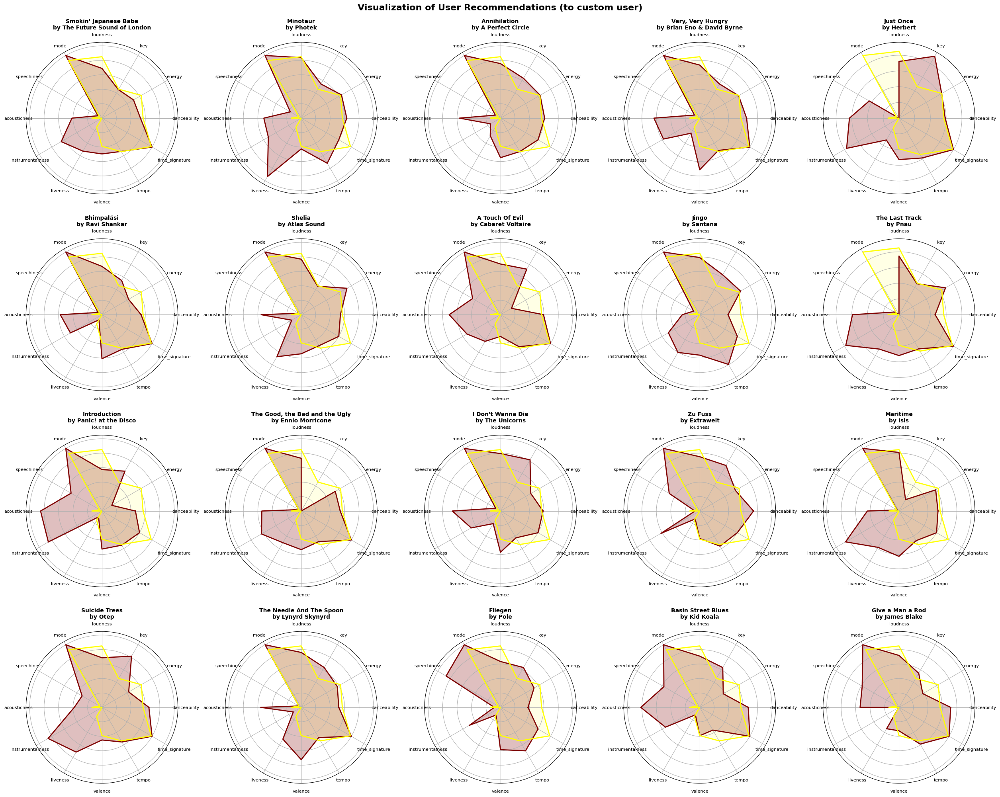

In [78]:
plot_user_recommendation(
    recommendations=recs_to_user,
    features=features,
    user_profile=user_profile,
    metric='to custom user'
)

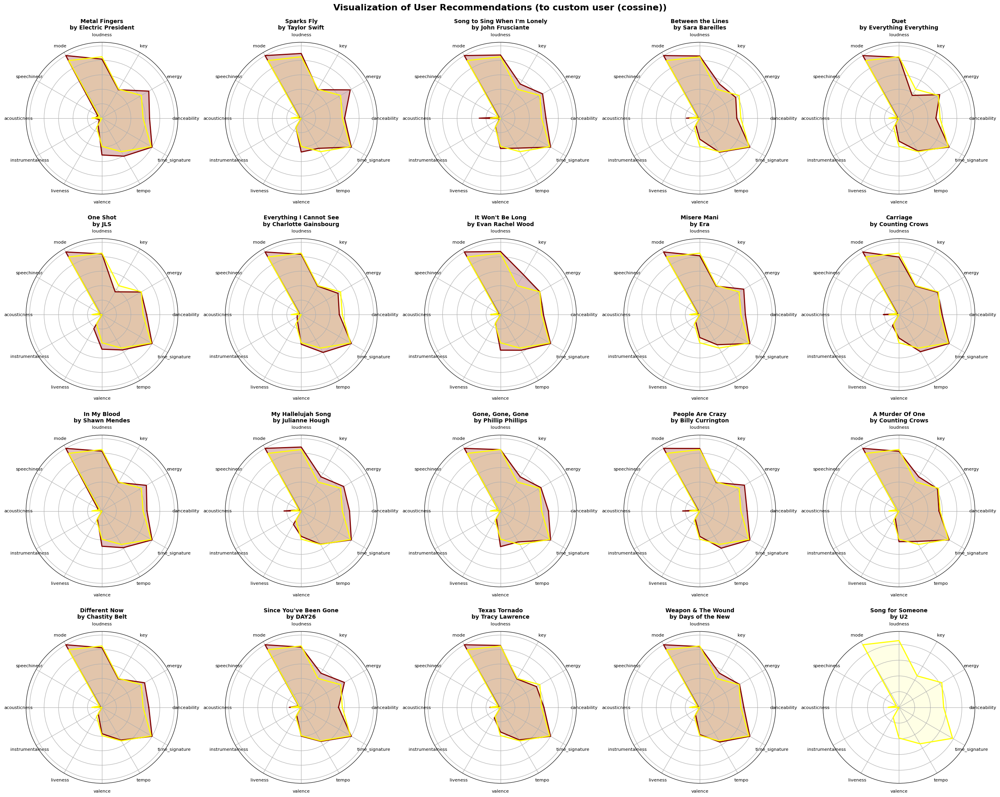

In [79]:
plot_user_recommendation(
    recommendations=recs_to_user_cos,
    features=features,
    user_profile=user_profile,
    metric='to custom user (cossine)'
)